In [1]:
# Import packages

import re, nltk, spacy, string

from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from pprint import pprint

import pyLDAvis
import pyLDAvis.sklearn
import matplotlib.pyplot as plt
%matplotlib inline

from plotly.offline import plot
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
from nltk.corpus import stopwords
from nltk import word_tokenize
import seaborn as sns
from googletrans import Translator

import os
import glob
import pandas as pd
import pickle
os.chdir('/home/matthew/anaconda3/envs/insight/staycationLA/notebooks')

/home/matthew/anaconda3/envs/insight/lib/python3.8/site-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.9 it will stop working
  from collections import Iterable
/home/matthew/anaconda3/envs/insight/lib/python3.8/site-packages/past/builtins/misc.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.9 it will stop working
  from collections import Mapping


In [2]:
#modified from 
#https://towardsdatascience.com/topic-modeling-quora-questions-with-lda-nmf-aff8dce5e1dd
#https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0
#https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0
#https://medium.com/@yanlinc/how-to-build-a-lda-topic-model-using-from-text-601cdcbfd3a6

In [3]:
#load data from NB01 scrape international city reviews
cities2 = pd.read_csv("../data/processed/cities_final_corpora.csv", index_col=None)
cities2

,city,english
0,istanbul,many place visit i ̇ capital city empire many ...
1,beijing,beijing good place learn happen travel sunday ...
2,phuket,must see last november rain cat dog pick day t...
3,santorini,christ modern times island perfect place spend...
4,cusco,cusco place cisco nice clean town architecture...
5,sydney,good thing warm sunny day coast walk city surr...
6,florence,great overview city great value see important ...
7,jaipur,pashmina shop visit friend mine beautiful pas...
8,luxor,luxor tour temple luxor valley king amazing ca...
9,marrakech,half half although part enjoy holiday glad go ...


In [4]:
#load data from NB04 LA attraction reviews combine
LA = pd.read_csv("../data/processed/LA_final_corpora.csv", index_col=None)
LA

,attraction,english,TA_url,rating,gps,url,type,name,pic,num_reviews,ranking
0,Universal_Studios_Hollywood,front line must family universal orlando la do...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.138416', '-118.35337')]",http://www.universalstudioshollywood.com/,Theme Parks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,36470,#1
1,Griffith_Observatory,griffith observatory another must see landmark...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.118492', '-118.30039')]",http://www.griffithobservatory.org/,Observatories & Planetariums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,20247,#2
2,Santa_Monica_Pier,end mother road must trip la pier iconic part ...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('34.01038', '-118.49594')]",http://santamonicapier.org/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,18866,#3
3,Hollywood_Walk_of_Fame,exciting crowded walk street hollywood think s...,https://www.tripadvisor.com/Attraction_Review-...,3.5,"[('34.1016', '-118.32672')]",http://www.walkoffame.com/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,17542,#4
4,The_Getty_Center,accidentally press wrong key get review page d...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.077564', '-118.474625')]",http://www.getty.edu/visit/center,Specialty Museums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,14503,#5
...,...,...,...,...,...,...,...,...,...,...,...
1330,Public_Art_You_Are_Not_Forgotten,powerful block inland beach art installation w...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('33.99334', '-118.47675')]",https://www.tripadvisor.com/Attractions-g32655...,Art Galleries,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1331,Mulholland_Memorial_Fountain,bring water city dry apt monument man remarkab...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.117', '-118.27169')]",http://waterandpower.org/museum/Mulholland_Mon...,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1332,Hermit_Falls,hermit fall go lot close house easy take santa...,https://www.tripadvisor.com/Attraction_Review-...,5.0,[],https://www.tripadvisor.com/Attraction_Review-...,Waterfalls,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269
1333,Ancient_Thai_Massage_and_Spa,great place de stress love go place area go ye...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.02695', '-117.89633')]",http://ancientthaispamassage.com/,Spas,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269


In [5]:
LA.dropna(subset=['attraction'], inplace=True)
LA

,attraction,english,TA_url,rating,gps,url,type,name,pic,num_reviews,ranking
0,Universal_Studios_Hollywood,front line must family universal orlando la do...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.138416', '-118.35337')]",http://www.universalstudioshollywood.com/,Theme Parks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,36470,#1
1,Griffith_Observatory,griffith observatory another must see landmark...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.118492', '-118.30039')]",http://www.griffithobservatory.org/,Observatories & Planetariums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,20247,#2
2,Santa_Monica_Pier,end mother road must trip la pier iconic part ...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('34.01038', '-118.49594')]",http://santamonicapier.org/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,18866,#3
3,Hollywood_Walk_of_Fame,exciting crowded walk street hollywood think s...,https://www.tripadvisor.com/Attraction_Review-...,3.5,"[('34.1016', '-118.32672')]",http://www.walkoffame.com/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,17542,#4
4,The_Getty_Center,accidentally press wrong key get review page d...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.077564', '-118.474625')]",http://www.getty.edu/visit/center,Specialty Museums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,14503,#5
...,...,...,...,...,...,...,...,...,...,...,...
1330,Public_Art_You_Are_Not_Forgotten,powerful block inland beach art installation w...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('33.99334', '-118.47675')]",https://www.tripadvisor.com/Attractions-g32655...,Art Galleries,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1331,Mulholland_Memorial_Fountain,bring water city dry apt monument man remarkab...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.117', '-118.27169')]",http://waterandpower.org/museum/Mulholland_Mon...,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1332,Hermit_Falls,hermit fall go lot close house easy take santa...,https://www.tripadvisor.com/Attraction_Review-...,5.0,[],https://www.tripadvisor.com/Attraction_Review-...,Waterfalls,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269
1333,Ancient_Thai_Massage_and_Spa,great place de stress love go place area go ye...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.02695', '-117.89633')]",http://ancientthaispamassage.com/,Spas,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269


In [6]:
combo = pd.concat([cities2, LA], axis=0)
combo

,city,english,attraction,TA_url,rating,gps,url,type,name,pic,num_reviews,ranking
0,istanbul,many place visit i ̇ capital city empire many ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,beijing,beijing good place learn happen travel sunday ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,phuket,must see last november rain cat dog pick day t...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,santorini,christ modern times island perfect place spend...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,cusco,cusco place cisco nice clean town architecture...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1330,NaN,powerful block inland beach art installation w...,Public_Art_You_Are_Not_Forgotten,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('33.99334', '-118.47675')]",https://www.tripadvisor.com/Attractions-g32655...,Art Galleries,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1.0,#269
1331,NaN,bring water city dry apt monument man remarkab...,Mulholland_Memorial_Fountain,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.117', '-118.27169')]",http://waterandpower.org/museum/Mulholland_Mon...,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1.0,#269
1332,NaN,hermit fall go lot close house easy take santa...,Hermit_Falls,https://www.tripadvisor.com/Attraction_Review-...,5.0,[],https://www.tripadvisor.com/Attraction_Review-...,Waterfalls,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1.0,#269
1333,NaN,great place de stress love go place area go ye...,Ancient_Thai_Massage_and_Spa,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.02695', '-117.89633')]",http://ancientthaispamassage.com/,Spas,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1.0,#269


In [7]:
#find how many characters are in corpora for each city
combo['english'] = combo['english'].astype(str)
print (combo['english'].head(30).apply(lambda x: len(x)))

0      484951
1      379942
2      149423
3      213584
4      147182
5      147854
6      344863
7       74538
8      277567
9      224624
10     142115
11     115778
12     273567
13     219368
14     134905
15     214723
16     190341
17     217007
18     114141
19     166524
20     197993
21      99525
22      76257
23     169557
0     2617641
1     1070716
2     1280868
3      645862
4     2136082
5      816969
Name: english, dtype: int64


In [8]:
combo = combo.reset_index(drop=True)

# Get names of indexes for attractions with only 1 review
indexNames = combo[ combo['num_reviews'] == 1 ].index
# Delete these row indexes from dataFrame
combo.drop(indexNames , inplace=True)
# Get names of indexes for attractions with only 2 review
indexNames = combo[ combo['num_reviews'] == 2 ].index
# Delete these row indexes from dataFrame
combo.drop(indexNames , inplace=True)

combo = combo.reset_index(drop=True)
#truncate strings longer than 1,000,000 characters
combo['english2'] = combo['english'].str.slice(0, 75000)
len(combo)

1071

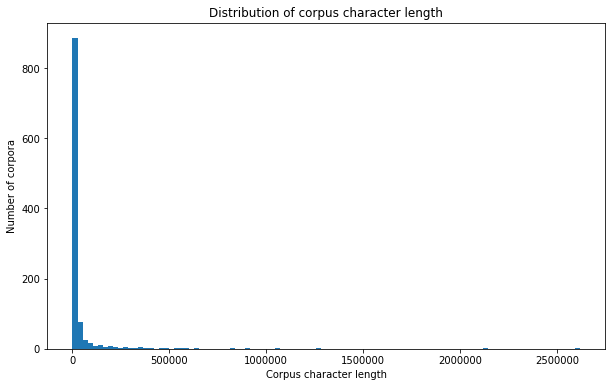

In [119]:
plt.figure(figsize=(10,6))
doc_lens = [len(d) for d in combo.english]
plt.hist(doc_lens, bins = 100)
plt.title('Distribution of corpus character length')
plt.ylabel('Number of corpora')
plt.xlabel('Corpus character length')
#sns.despine()
plt.show()

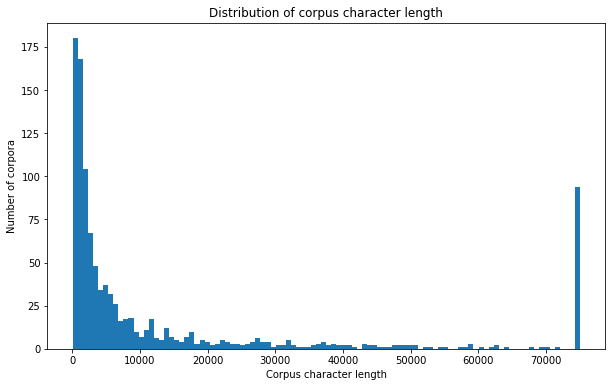

In [120]:
plt.figure(figsize=(10,6))
doc_lens = [len(d) for d in combo.english2]
plt.hist(doc_lens, bins = 100)
plt.title('Distribution of corpus character length')
plt.ylabel('Number of corpora')
plt.xlabel('Corpus character length')
#sns.despine()
plt.show()
#lower number of character length at 0 indicates removal of rows with 0 reviews

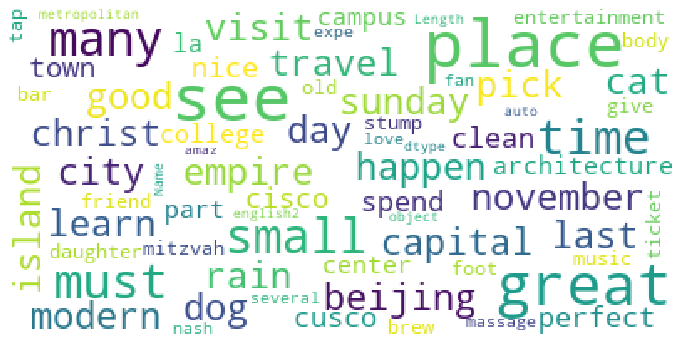

In [121]:

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS

mpl.rcParams['figure.figsize']=(12.0,12.0)  
mpl.rcParams['font.size']=12            
mpl.rcParams['savefig.dpi']=100             
mpl.rcParams['figure.subplot.bottom']=.1 
stopwords = set(STOPWORDS)

wordcloud = WordCloud(
                          background_color='white',
                          stopwords=stopwords,
                          max_words=500,
                          max_font_size=40, 
                          random_state=42
                         ).generate(str(combo['english2']))

print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.axis('off')
plt.show();

In [122]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(combo['english2'], 30)
df2 = pd.DataFrame(common_words, columns = ['unigram' , 'count'])

fig = go.Figure([go.Bar(x=df2['unigram'], y=df2['count'])])
fig.update_layout(title=go.layout.Title(text="Top 30 unigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [123]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english', max_df = 0.4).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(combo['english2'], 30)
df2 = pd.DataFrame(common_words, columns = ['unigram' , 'count'])

fig = go.Figure([go.Bar(x=df2['unigram'], y=df2['count'])])
fig.update_layout(title=go.layout.Title(text="Top 30 unigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [129]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english', max_df = 0.3).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(combo['english2'], 30)
df2 = pd.DataFrame(common_words, columns = ['unigram' , 'count'])

fig = go.Figure([go.Bar(x=df2['unigram'], y=df2['count'])])
fig.update_layout(title=go.layout.Title(text="Top 30 unigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [13]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(combo['english2'], 20)
df3 = pd.DataFrame(common_words, columns = ['bigram' , 'count'])

fig = go.Figure([go.Bar(x=df3['bigram'], y=df3['count'])])
fig.update_layout(title=go.layout.Title(text="Top 20 bigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [14]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_trigram(combo['english2'], 20)
df4 = pd.DataFrame(common_words, columns = ['trigram' , 'count'])

fig = go.Figure([go.Bar(x=df4['trigram'], y=df4['count'])])
fig.update_layout(title=go.layout.Title(text="Top 20 trigrams in the question text"))
fig.show()

In [9]:
len(combo)

1071

In [10]:
#remove a few more weird attractions
combo = combo[~combo['attraction'].isin(['Psychiatry_An_Industry_of_Death'])]#scientology propaganda museum
combo = combo[~combo['attraction'].isin(['Foothill_Transit'])]#bus
combo = combo[~combo['attraction'].isin(['Williams_Hart_Transportation'])]#limo
combo = combo[~combo['attraction'].isin(['Union_Station'])]#transportation
combo = combo[~combo['attraction'].isin(['Museum_of_Death'])]#wierd museum
combo = combo[~combo['attraction'].isin(['WiFi_rental_around_world_Vision_Global_WiFi'])]#wierd museum
combo = combo[~combo['attraction'].isin(['Los_Angeles_Convention_Center'])]#convention center has many different events- don't want to just recommend the center itself
combo = combo[~combo['type'].isin(['Visitor Centers'])]
combo = combo[~combo['type'].isin(['Rides & Activities'])]
combo = combo[~combo['type'].isin(['Arenas & Stadiums'])]
combo = combo[~combo['type'].isin(['Breweries'])]
combo = combo[~combo['type'].isin(['Distilleries'])]
combo = combo[~combo['type'].isin(['Theme Parks'])]
combo = combo[~combo['type'].isin(['Water Parks'])]
#combo = combo[~combo['type'].isin(['Shopping Malls'])]
combo = combo.reset_index(drop=True)

In [11]:
len(combo)

995

In [11]:
#if combo['attraction'].str.contains('Fashion_District').any():
#    print ("is there")

is there


In [164]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as esw
stopWords = ['phuket', 'santorini', 'cusco', 'sydney', 'istanbul', 'florence', 'cape', 'town', 'havana', 'jaipur', 'luxor', 'marrakech', 'rio', 'salzburg', "beijing", "st", "petersburg", 'edinburgh', 'lisbon', 'berlin', "capetown", "www", "com", "lisboa", "lira", "hagia", "sophia", "baht", "phi", "yuan", "maria", "hermitage", "lax", "tourist", "hotel", "taxi", "shuttle", "manly", "arrive", "return", "travel", "subway", "book", "airport", "station", "bus", "country", "guide",  "das", "ich", "ough", "die", "che","non", "ing", "ist",  "shanghai", "air", "cab", "transport", "safe",  "holiday", "cruise", "security", "overnight", "terminal", "luggage", "porter", "speak", "para", "sind", "bus", "card", "wir", "wird", "nach", "wert", "burg", "tor", "capital", "sol", "villa", "vacation", "sugar", "loaf", "welt", "hire", "police", "safety", "credit", "las",  "tip", "turkey", "mosque", "breakfast", "lunch", "dinner", "dirty", "bank",  "medina", "mit", "den", "duomo", "english", "driver", "rum", "david", "piazza" , "mozart", "metro",  "upgrade", "wende", "visa", "man", "restaurant", "eat", "american", "meal", "paul", "money", "pound",  "mile", "fry", "steak", "brunch", "menu", "salad",  "week", "car", "meet", "nile", "sunday", "thursday", "monday", "tuesday", "wednesday",  "ale", "brewery", "distillery", "beer", "wine", "convention", "conference","friday", "saturday", "drink", "flight", "whiskey", "pub", "buffet",  "bar", "service", "expect", "change", "bed",  "summer", "winter", "dine", "chain",  "taste", "tasting",  "christmas", "cocktail", "traffic", "reservation", "season", "review", "company",  "helpful",  "online", "venue", "ave", "ask", "liquor",  "gin", "order", "weekend", "cheese", "chicken", "whilst", "cheap",  "dining", "eatery",  "brew",  "bottle", "ice", "cream", "public", "final", "cost", "euro", "tram", "disneyland", "appetizer", "touristy", "hop", "discount", "sickness",  "guided", "self", "fee", "ticket", "language"] + list(esw) 

In [ ]:
#https://stackoverflow.com/questions/12118720/python-tf-idf-cosine-to-find-document-similarity
tfidf = TfidfVectorizer().fit_transform(reviews)
tfidf

In [ ]:
from sklearn.metrics.pairwise import linear_kernel
cosine_similarities = linear_kernel(tfidf[0:1], tfidf[18:]).flatten()
cosine_similarities

In [111]:
from sklearn.model_selection import GridSearchCV
# Define Search Param
search_params = {'n_components': [20, 30, 40, 50, 60], 'learning_decay': [.5, .7, .9]}
# Init the Model
lda = LatentDirichletAllocation(learning_method='online',
                                      random_state=0,  
                                      doc_topic_prior = 12, # to increase # topics per document
                                      topic_word_prior = 0.000000001, #to decrease the # words per topic
                                      n_jobs = -1  # Use all available CPUs
                                     )
# Init Grid Search Class
model = GridSearchCV(lda, param_grid=search_params)
# Do the Grid Search
model.fit(data_vectorized)
GridSearchCV(cv=None, error_score='raise',
       estimator=LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7, learning_method=None,
             learning_offset=10.0, max_doc_update_iter=100, max_iter=10,
             mean_change_tol=0.001, n_components=20, n_jobs=1,
             n_topics=None, perp_tol=0.1, random_state=None,
             topic_word_prior=None, total_samples=1000000.0, verbose=0),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'n_topics': [20, 30, 40, 50, 60], 'learning_decay': [0.5, 0.7, 0.9]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

TypeError: __init__() got an unexpected keyword argument 'n_topics'

In [113]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import GridSearchCV

# Options to try with our LDA
# Beware it will try *all* of the combinations, so it'll take ages
search_params = {
  'n_components': [20, 30, 40, 50],
  'learning_decay': [.5, .7, .9]
}

# Set up LDA with the options we'll keep static
model = LatentDirichletAllocation(learning_method='online')

# Try all of the options
gridsearch = GridSearchCV(model, param_grid=search_params, n_jobs=-1, verbose=1)
gridsearch.fit(data_vectorized)

# What did we find?
print("Best Model's Params: ", gridsearch.best_params_)
print("Best Log Likelihood Score: ", gridsearch.best_score_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 27.6min finished


Best Model's Params:  {'learning_decay': 0.5, 'n_components': 20}
Best Log Likelihood Score:  -1412158.2248556498


In [12]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as esw
stopWords = ['town', "st", "www", "com", "lisboa", "lira", "hagia", "sophia", "baht", "phi", "yuan", "maria", "hermitage", "frank", "wright", "bob", "hollyhock", "harry", "madame", "lax", "tourist", "hotel", "taxi", "shuttle", "celebrity", "fan", "colorado", "pacific", "fame", "mary", "football", "roger", "charlie", "catalina", "universal", "studio", "potter", "bowl", "roller", "coaster", "observatory", "wax", "star", "rodeo", "transformer", "mummy", "aquarium", "muscle", "planetarium", "telescope", "manly", "poppy", "antelope", "goliath", "tar", "superman", "platinum", "throttle", "hurricane", "minion", "colossus", "arrive", "return", "travel", "subway", "book", "walt", "graham", "airport", "station", "bus", "country", "guide", "vera", "das", "ich", "ough", "broad", "die", "che","non", "ing", "ist", "pico", "culver", "cirque", "soleil", "academy", "kodak", "text", "shanghai", "air", "cab", "transport", "safe", "blade","cal", "gene", "holiday", "cruise", "security", "overnight", "terminal", "luggage", "porter", "speak", "homeless", "jeep", "channel", "conservancy", "pit", "fossil", "montana", "angel", "san", "dodger", "flash", "serial", "killer", "pedro", "forum", "union", "para", "sind", "bus", "bone", "tube", "rage", "lab", "tuck", "course", "dean", "martin", "jack", "joe", "card", "state", "peter", "dinosaur", "skeleton", "wir", "wird", "nach", "wert", "burg", "tor", "capital", "mammal", "jeopardy", "pressure", "sol", "villa", "flag", "foot", "vacation", "watt", "ark", "holocaust", "haulocaust", "sugar", "loaf", "welt", "figure", "hire", "police", "highland", "boulevard", "safety", "credit", "warner", "burbank", "paramount", "tony", "van", "las", "locker", "theme", "tip", "turkey", "mosque", "lawn", "breakfast", "lunch", "episode", "shoot", "laker", "dinner", "dirty", "bank", "vine", "mark", "sign", "medina", "mit", "den", "duomo", "english", "driver", "christ", "revolution", "rum", "david", "piazza" ,"clipper", "mozart", "metro", "rancho", "greene", "man", "manhattan", "iowa", "pasadena", "cowboy", "oscar", "griffith", "gogh", "disney", "dolby", "hollywood", "tussaud", "upgrade", "trump", "freeway","runyon","lloyd", "americana", "monroe", "venice", "santa", "simon", "wende", "visa", "man", "palisade", "belmont", "america", "huntington", "restaurant", "eat", "american", "meal", "paul", "money", "pound", "noah", "mile", "fry", "steak", "mash", "brunch", "menu", "salad", "bradbury", "baldwin", "arboretum", "lancaster", "gabriel", "arcadia", "anne", "week", "burger", "toyota", "centre", "center", "staple", "car", "meet", "nile", "sunday", "thursday", "monday", "tuesday", "wednesday", "watts", "ale", "brewery", "distillery", "beer", "wine", "convention", "conference", "racetrack", "rose", "friday", "saturday", "drink", "flight", "whiskey", "pub", "buffet", "grove", "tournament", "table", "apollo", "bar", "service", "expect", "change", "bed", "sandwich", "campus", "university", "cent", "coffee", "summer", "winter", "dine", "chain", "library", "winery", "taste", "tasting", "playhouse", "strip", "christmas", "cookie", "prop", "cocktail", "blood", "traffic", "chateau", "reserve", "membership", "birthday", "computer", "mall", "reservation", "season", "review", "company", "eric", "cup", "helpful", "school", "character", "memorabilia", "wilson", "online", "venue", "ave", "ask", "cafe", "pose", "unlimited", "dial", "craftsman", "party", "college", "campground", "liquor", "karen", "gin", "robin", "order", "drop", "weekend", "cheese", "chicken", "abbot", "bungee", "santee", "express", "whilst", "cheap", "mexico", "decide", "dining", "eatery", "marry", "brew", "hawthorne", "bottle", "ice", "cream", "wedding", "wells", "fargo", "stagecoach", "public", "final", "cost", "euro", "tram", "disneyland", "goldberg", "whittier",  "witch", "southwest", "appetizer", "touristy", "hop", "discount", "sickness", "private", "guided", "self", "fee", "ticket", "language", "wayfarer", "taping", "hope", "organise", "organize", "arrange", "contact", "haggle", "resort", "accommodation", "douglas", "capitol", "lodge", "makeup", "silence", "mike", "crime", "violence", "dangerous", "negative", "andrew", "sam", "smog", "fake", "henry", "ben", "michael", "jackson", "taylor", "metre", "swift", "award", "agua", "kirk", "leo", "porta", "potty", "diana", "tapa", "espana", "hassle", "divide", "norman", "orlando", "simpson", "sheraton", "lucy", "construction", "brooks", "graduate", "native", "transportation", "drug", "danger", "unsafe", "emergency", "flexible", "carlos", "expo", "chi", "tho", "vodka", "sum", "student", "victor", "hong", "email", "ruin", "concierge", "dim", "murder", "jones", "bel", "george", "lemmon", "rodney", "prom", "poor", "sausage", "capitan", "jimmy", "wrist", "wand", "jurassic", "furious", "daniel", "excursion", "towel", "inclusive", "transer", "december", "suicide", "november", "october", "september", "august", "july", "june", "may", "april", "february", "january", "portion", "passport", "bomb", "cos", "yen", "rebecca", "vermont", "enforcement", "gateway", "pork", "onion", "validate", "curtain", "feb", "catering", "nelson", "token", "nasa", "pint", "chili", "charles", "carl", "mel", "tap", "wristband", "bruce", "physics", "traveller", "negotiate", "operator", "fortune", "tape", "adam", "johnny", "walter", "agency", "traveller", "ease", "lincoln", "doctor", "terribly", "download", "nightmare", "concession", "cafeteria", "robert", "hamburger", "thomas", "attendant", "guinness", "dollar", "robinson", "graduation", "mar", "trailer", "housing", "gps", "ride", "bad", "wedding", "marry", "marriage", "reception", "bride", "groom", "louis", "garlic", "king", "government", "welcome", "hospital", "clinic", "whiskey", "staff", "ask", "question", "directions", "questions", "direction", "kiosk", "lodging", "maps", "map", "mate", "endeavour", "polite", "cabin", "sauce", "apartment", "hospitality", "transfer", "headache", "suitcase", "network", "maximum", "courtesy", "drunk", "abroad", "lifelike", "realistic", "voucher", "griffin", "scott"] + list(esw) 

In [13]:
vectorizer = CountVectorizer(analyzer='word',       
                             min_df=2,                       
                             stop_words=stopWords,             
                             lowercase=True,                   
                             token_pattern='[a-zA-Z0-9]{3,}',  
                             max_features=3500, 
                             max_df = 0.4                        )

data_vectorized = vectorizer.fit_transform(combo['english2'])

In [14]:
lda_model = LatentDirichletAllocation(n_components=50, # Number of topics
                                      learning_method='online',
                                      random_state=0,  
                                      doc_topic_prior = 9, # to increase # topics per document
                                      topic_word_prior = 0.000000001, #to decrease the # words per topic
                                      n_jobs = -1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_vectorized)

pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_vectorized, vectorizer, mds='tsne')

PreparedData(topic_coordinates=               x          y  topics  cluster      Freq
topic                                                 
31    -47.305004  -7.219061       1        1  8.204511
42    -41.811394  16.334700       2        1  6.720770
23     52.007107   6.800969       3        1  5.139396
33     32.899872  38.737553       4        1  4.717318
38     53.952633 -11.463368       5        1  3.763224
3     -31.720875   2.083866       6        1  3.437594
14    -11.609293  20.789143       7        1  3.357901
46      0.808451 -55.036686       8        1  2.764008
30     20.821291 -28.915970       9        1  2.670179
15     30.460056 -21.604538      10        1  2.305929
5     -11.263727  36.901943      11        1  2.201476
49      1.582716  44.157169      12        1  2.155979
32    -30.874193 -14.685112      13        1  2.122975
13     15.585122  33.441463      14        1  1.998814
11     45.772099 -27.847357      15        1  1.986932
7       8.887932 -31.794897      16        1  1.971187
43     15.644303 -44.224724      17        1  1.930153
20     32.323776 -39.465786      18        1  1.885623
21     -4.419475 -36.484531      19        1  1.853230
16    -25.854734  29.409122      20        1  1.816456
29    -17.066006 -45.278893      21        1  1.772530
12      1.196291  25.694695      22        1  1.713593
9     -34.382164 -32.011314      23        1  1.616969
44     32.732773   3.596606      24        1  1.589870
22    -21.069368 -29.401930      25        1  1.576107
19     38.259499  -8.498672      26        1  1.480173
45     40.078667  17.284220      27        1  1.477021
36    -19.829515  -4.450105      28        1  1.470686
28     26.899378  22.090759      29        1  1.455125
26     13.770215  19.801661      30        1  1.429209
8     -16.270844 -17.301659      31        1  1.428494
10    -14.522988   6.187957      32        1  1.358038
35    -23.804081  14.050460      33        1  1.346135
17     -5.864279 -23.883547      34        1  1.249155
39     -2.432654 -14.065077      35        1  1.155452
47     26.133715  -8.710095      36        1  1.117461
6      21.860872  10.010071      37        1  1.088924
4       4.760563 -20.637516      38        1  1.008606
18     -5.959396   0.906489      39        1  1.002883
34      3.296201   3.524114      40        1  0.986287
27     14.728036 -17.810921      41        1  0.979111
25     19.403353   0.139066      42        1  0.976555
2      15.951795  -8.641789      43        1  0.976496
48      0.690944  -5.002843      44        1  0.970629
0       4.615981  13.054909      45        1  0.969873
41      9.875013  -2.276943      46        1  0.965556
37     -4.147273  10.165692      47        1  0.963264
40      6.943389 -11.324144      48        1  0.959366
24     11.951250   6.799662      49        1  0.956819
1      -9.357146  -8.158034      50        1  0.955958, topic_info=         Term          Freq         Total Category  logprob  loglift
277     beach  13561.000000  13561.000000  Default  30.0000  30.0000
1996   museum  10371.000000  10371.000000  Default  29.0000  29.0000
1651   island   3196.000000   3196.000000  Default  28.0000  28.0000
1466     hike   3787.000000   3787.000000  Default  27.0000  27.0000
1283   garden   3877.000000   3877.000000  Default  26.0000  26.0000
...       ...           ...           ...      ...      ...      ...
1100  explore     26.308190   1607.036621  Topic50  -5.7239   0.5379
3372     wait     26.300671   1694.126946  Topic50  -5.7242   0.4849
1470     hill     26.668045   2168.984677  Topic50  -5.7103   0.2517
1452     help     25.601927   1407.092242  Topic50  -5.7511   0.6436
429       buy     25.715961   2187.596357  Topic50  -5.7466   0.2068

[3006 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1         1  0.168424  abalone
1         3  0.072182  abalone
1        25  0.745878  abalone
4         8  0.127516   aboard
4        16  0.019618   aboard
...     ...   

In [15]:
import numpy as np
def show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=20):
    keywords = np.array(vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords

topic_keywords = show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=20)

df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Word '+str(i) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14,Word 15,Word 16,Word 17,Word 18,Word 19
Topic 0,art,movie,museum,event,photo,hill,line,picture,class,learn,downtown,past,afternoon,game,buy,turn,wait,access,light,store
Topic 1,museum,art,music,event,site,line,movie,selection,picture,unique,item,allow,light,hard,afternoon,learn,huge,age,display,variety
Topic 2,museum,art,picnic,photo,event,gem,movie,picture,afternoon,beach,donation,light,class,adult,wait,plan,site,huge,clay,learn
Topic 3,store,shopping,product,stroll,avenue,boutique,expensive,window,buy,block,brand,fashion,unique,skin,atmosphere,clothing,seville,trendy,designer,district
Topic 4,art,museum,music,event,class,game,unique,learn,facility,road,line,gem,huge,turn,photo,attend,afternoon,evening,program,site
Topic 5,hall,downtown,architecture,floor,movie,interior,elevator,film,grand,photo,design,central,observation,architectural,runner,historic,deck,office,lobby,visitor
Topic 6,golf,hole,ball,green,ocean,tee,club,national,game,challenge,round,event,fairway,afternoon,hard,range,picnic,huge,photo,class
Topic 7,temple,luxor,vietnam,lake,egypt,boat,market,valley,buy,head,bay,road,thank,hot,west,museum,vietnamese,problem,hand,quarter
Topic 8,escape,peru,valley,plaza,main,altitude,help,site,lesson,square,sacred,cultural,explore,buy,husband,sun,incredible,spanish,plan,pick
Topic 9,church,mission,cathedral,modern,architecture,mass,catholic,gift,attend,mexican,art,spanish,religious,ground,lady,pueblo,garden,wall,saint,light


In [79]:
Topics_theme = ['visual arts', 'art and music', 'art and nature', 'shopping', 'art and learning', 
                'architecture', 'golf', 'temples and boats', 'escapes', 'churches', 
                'viewpoints', 'cemeteries', 'markets', 'oceans', 'movies',                 
                'palaces', 'racing', 'science', 'movies and music', 'urban exploring', 
                'walking areas',  'museums', 'peacuful places', 'hiking', 'stores',  
                'photo ops', 'nightlife', 'learning', 'trains', 'ships',  
                'animals', 'beaches', 'art deco design', 'performances', 'parks', 
                'planes', 'cultural attractions', 'art museums', 'gardens', 'movies and pictures', 
                'museums and outdoors', 'taking pictures', 'art', 'memorials', 'China', 
                'outdoor activities', 'islands', 'seasides', 'beaches', 'tours',                 
                 ]
df_topic_keywords['topic_theme'] = Topics_theme
df_topic_keywords.set_index('topic_theme', inplace=True)
df_topic_keywords.T

topic_theme,visual arts,art and music,art and nature,shopping,art and learning,architecture,golf,temples and boats,escapes,churches,viewpoints,cemeteries,markets,oceans,movies,palaces,racing,science,movies and music,urban exploring,walking areas,museums,peacuful places,hiking,stores,photo ops,nightlife,learning,trains,ships,animals,beaches,art deco design,performances,parks,planes,cultural attractions,art museums,gardens,movies and pictures,museums and outdoors,taking pictures,art,memorials,China,outdoor activities,islands,seasides,beaches,tours
Word 0,art,museum,museum,store,art,hall,golf,temple,escape,church,sunset,cemetery,market,whale,movie,palace,race,science,movie,rio,canal,museum,chapel,hike,store,photo,medellin,museum,train,ship,animal,beach,movie,seat,lake,plane,istanbul,museum,garden,museum,museum,picture,museum,berlin,chinese,dog,island,ocean,beach,docent
Word 1,movie,art,art,shopping,museum,downtown,hole,luxor,peru,mission,famous,grave,florence,sydney,museum,petersburg,horse,museum,picture,beach,bridge,collection,glass,trail,museum,movie,mountain,event,hill,volunteer,japanese,pier,casino,theater,echo,fly,blue,art,plant,site,neon,hill,exhibit,tower,beijing,mansion,boat,bell,museum,architecture
Word 2,museum,music,picnic,product,music,architecture,ball,vietnam,valley,cathedral,club,famous,fresh,lighthouse,picture,fort,track,event,photo,mountain,edinburgh,music,queen,road,photo,tree,modern,class,railway,deck,zoo,bike,theater,concert,photo,gift,grand,line,flower,movie,photo,photo,art,cape,china,picnic,sea,korean,art,art
Word 3,event,event,photo,stroll,event,floor,green,lake,plaza,modern,iconic,bury,farmer,iceland,photo,pink,havana,learn,hill,statue,castle,musical,ocean,hiking,activity,picture,light,learn,central,war,tokyo,ocean,salzburg,theatre,museum,sky,site,buy,tree,age,display,art,collection,museum,wall,market,harbor,picnic,photo,design
Word 4,photo,site,event,avenue,class,movie,ocean,egypt,main,architecture,west,memorial,produce,harbour,film,thai,racing,facility,road,explore,stroll,antique,church,canyon,art,road,colombia,massage,museum,board,japan,sand,ballroom,stage,picnic,island,turkish,afternoon,bloom,learn,explore,light,display,south,buy,farmer,kayak,beach,afternoon,ground
Word 5,hill,line,gem,boutique,game,interior,tee,boat,altitude,mass,road,peaceful,fruit,opera,floor,buy,bet,program,music,carry,neighborhood,instrument,tree,rock,variety,hill,spring,site,grand,military,buy,path,island,sound,young,pilot,modern,event,memorial,art,picnic,museum,exhibition,africa,pearl,court,cave,grass,downtown,tile
Word 6,line,movie,movie,expensive,unique,elevator,club,market,help,catholic,music,ground,vendor,point,costume,shopping,drag,control,film,carnival,walkway,vehicle,peaceful,mountain,huge,light,weather,age,railroad,battleship,store,sunset,art,performance,learn,land,carpet,photo,desert,middle,class,road,artist,cold,line,tennis,dolphin,relax,nearby,gamble
Word 7,picture,selection,picture,window,learn,film,national,valley,site,gift,busy,movie,buy,picnic,famous,india,cuba,art,light,brazil,quiet,vintage,ground,hill,buy,visitor,south,hand,market,museum,exhibit,wave,deco,parade,picture,buffalo,bazaar,wait,nature,picture,site,class,sculpture,wall,square,playground,beach,korea,unique,craft
Word 8,class,picture,afternoon,buy,facility,grand,game,buy,lesson,attend,rock,quiet,delicious,beach,display,culture,event,line,site,head,unique,classic,gorgeous,dog,adult,event,surprise,donation,historic,gun,sushi,dog,dance,movie,class,bison,culture,variety,peaceful,photo,age,firehouse,gallery,east,temple,basketball,ferry,friendship,relax,original
Word 9,learn,unique,beach,block,road,photo,challenge,head,square,mexican,hill,rest,art,blue,attraction,ethiopia,mountain,exploration,picnic,music,peaceful,road,surround,nature,light,young,museum,display,climb,learn,shark,stroll,music,event,movie,aviation,pick,beach,japanese,unique,line,activity,admission,mountain,wait,field,whale,kite,event,style


In [80]:
## Create Document - Topic Matrix
lda_output = lda_model.transform(data_vectorized)

# column names
topicnames = df_topic_keywords.T.columns

# index names
docnames = ["Doc" + str(i) for i in range(len(combo))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

df_document_topic.reset_index(inplace=True)
df_sent_topic= pd.merge(combo, df_document_topic, left_index=True, right_index=True)
df_sent_topic.drop('index', axis=1, inplace=True)

df_topic_theme = df_sent_topic[['english', 'dominant_topic']]

def label_theme(row):
    
    if row['dominant_topic'] == 0:
        return 'visual arts'
    if row['dominant_topic'] == 1:
        return 'art and music'
    if row['dominant_topic'] == 2:
        return 'art and nature'
    if row['dominant_topic'] == 3:
        return 'shopping'
    if row['dominant_topic'] == 4:
        return 'art and learning'
    if row['dominant_topic'] == 5:
        return 'architecture'
    if row['dominant_topic'] == 6:
        return 'golf'
    if row['dominant_topic'] == 7:
        return 'temples and boats'
    if row['dominant_topic'] == 8:
        return 'escapes'
    if row['dominant_topic'] == 9:
        return 'churches'
    if row['dominant_topic'] == 10:
        return 'viewpoints'
    if row['dominant_topic'] == 11:
        return 'cemetaries'
    if row['dominant_topic'] == 12:
        return 'markets'
    if row['dominant_topic'] == 13:
        return 'oceans'
    if row['dominant_topic'] == 14:
        return 'movies'
    if row['dominant_topic'] == 15:
        return 'palaces'
    if row['dominant_topic'] == 16:
        return 'racing'
    if row['dominant_topic'] == 17:
        return 'science'
    if row['dominant_topic'] == 18:
        return 'movies and music'
    if row['dominant_topic'] == 19:
        return 'urban exploring'    
    if row['dominant_topic'] == 20:
        return 'walking areas'
    if row['dominant_topic'] == 21:
        return 'museums'
    if row['dominant_topic'] == 22:
        return 'peaceful places'
    if row['dominant_topic'] == 23:
        return 'hiking'
    if row['dominant_topic'] == 24:
        return 'stores'
    if row['dominant_topic'] == 25:
        return 'photo ops'
    if row['dominant_topic'] == 26:
        return 'nightlife'
    if row['dominant_topic'] == 27:
        return 'learning'
    if row['dominant_topic'] == 28:
        return 'trains'
    if row['dominant_topic'] == 29:
        return 'ships'
    if row['dominant_topic'] == 30:
        return 'animals'
    if row['dominant_topic'] == 31:
        return 'beaches'
    if row['dominant_topic'] == 32:
        return 'art deco design'
    if row['dominant_topic'] == 33:
        return 'performances'
    if row['dominant_topic'] == 34:
        return 'parks'
    if row['dominant_topic'] == 35:
        return 'planes'
    if row['dominant_topic'] == 36:
        return 'cultural attractions'
    if row['dominant_topic'] == 37:
        return 'art museums'
    if row['dominant_topic'] == 38:
        return 'gardens'
    if row['dominant_topic'] == 39:
        return 'movies and pictures'
    if row['dominant_topic'] == 40:
        return 'museums and outdoors'
    if row['dominant_topic'] == 41:
        return 'taking pictures'
    if row['dominant_topic'] == 42:
        return 'art'
    if row['dominant_topic'] == 43:
        return 'memorials'
    if row['dominant_topic'] == 44:
        return 'China'
    if row['dominant_topic'] == 45:
        return 'outdoor activities'
    if row['dominant_topic'] == 46:
        return 'islands'
    if row['dominant_topic'] == 47:
        return 'seasides'
    if row['dominant_topic'] == 48:
        return 'beaches'
    if row['dominant_topic'] == 49:
        return 'tours'
    
   
df_topic_theme['dominant_topic_theme'] = df_topic_theme.apply (lambda row: label_theme(row), axis=1)
df_topic_theme.tail(10)

<ipython-input-80-065b31796e91>:127: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,english,dominant_topic,dominant_topic_theme
985,serve diverse congregation catholic parish fou...,9,churches
986,magical place veteran parrot serenity park san...,29,ships
987,iconic culver city dive bar wife time kill stu...,0,visual arts
988,great community park activity tennis basketbal...,45,outdoor activities
989,small museum sampling meteorite collection sma...,42,art
990,small big heart go production theater couple y...,33,performances
991,small college center la campus part daughter c...,0,visual arts
992,see g bar mitzvah friend give ticket see music...,0,visual arts
993,great foot body massage several time love expe...,0,visual arts
994,must see fan nash metropolitan auto small amaz...,21,museums


In [81]:
df_topic_theme.head(30)

,english,dominant_topic,dominant_topic_theme
0,many place visit i ̇ capital city empire many ...,36,cultural attractions
1,beijing good place learn happen travel sunday ...,44,China
2,must see last november rain cat dog pick day t...,15,palaces
3,christ modern times island perfect place spend...,46,islands
4,cusco place cisco nice clean town architecture...,8,escapes
5,good thing warm sunny day coast walk city surr...,13,oceans
6,great overview city great value see important ...,12,markets
7,pashmina shop visit friend mine beautiful pas...,15,palaces
8,luxor tour temple luxor valley king amazing ca...,7,temples and boats
9,half half although part enjoy holiday glad go ...,30,animals


In [82]:
#4 topics in 30, 3 in 35

In [360]:
#df_document_topic

In [361]:
#import gensim

In [362]:
#pip install gensim

In [83]:
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

combolist = []
combo3=pd.DataFrame(combo['english'])
for row in combo3.itertuples():
    row2=[item for item in row if not isinstance(item, int)]
    mytext_4 = vectorizer.transform(row2)
    topic_probability_scores = lda_model.transform(mytext_4)
    #topic = combo_topic_keywords.iloc[np.argmax(topic_probability_scores), :].values.tolist()
    combolist.append(topic_probability_scores)
   

In [84]:
from itertools import chain
new_list = [x for x in chain.from_iterable(combolist)]
combo4 = pd.DataFrame.from_records(new_list)
combo4.columns = ['visual arts', 'art and music', 'art and nature', 'shopping', 'art and learning', 
                'architecture', 'golf', 'temples and boats', 'escapes', 'churches', 
                'viewpoints', 'cemeteries', 'markets', 'oceans', 'movies',                 
                'palaces', 'racing', 'science', 'movies and music', 'urban exploring', 
                'walking areas',  'museums', 'peacuful places', 'hiking', 'stores',  
                'photo ops', 'nightlife', 'learning', 'trains', 'ships',  
                'animals', 'beaches', 'art deco design', 'performances', 'parks', 
                'planes', 'cultural attractions', 'art museums', 'gardens', 'movies and pictures', 
                'museums and outdoors', 'taking pictures', 'art', 'memorials', 'China', 
                'outdoor activities', 'islands', 'seasides', 'beaches', 'tours',                 
                 ]

In [85]:
#ADD MORE COLUMNS TO DELETE HERE AFTER TESTING THE RECOMMENDATIONS


In [86]:
combo_concat2 = pd.concat([combo, combo4], axis=1)
type(combo_concat2)
#combo_concat2.head(20)
combo_concat3=combo_concat2.drop(['attraction', "english", "english2", "city", "TA_url", "rating", "gps", "url", "type", "name", "pic", "num_reviews", "ranking"], axis=1)

combo_concat3.dropna(inplace=True)
pd.set_option('display.max_columns', None)
combo_concat3.head(20)

<ipython-input-86-d4c81394c820>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,visual arts,art and music,art and nature,shopping,art and learning,architecture,golf,temples and boats,escapes,churches,viewpoints,cemeteries,markets,oceans,movies,palaces,racing,science,movies and music,urban exploring,walking areas,museums,peacuful places,hiking,stores,photo ops,nightlife,learning,trains,ships,animals,beaches,art deco design,performances,parks,planes,cultural attractions,art museums,gardens,movies and pictures,museums and outdoors,taking pictures,art,memorials,China,outdoor activities,islands,seasides,beaches,tours
0,0.001219,0.001358,0.001210,0.032413,0.001317,0.009804,0.001639,0.056289,0.012034,0.015591,0.001502,0.003181,0.024886,0.009811,0.003715,0.123826,0.005631,0.001684,0.001280,0.009082,0.006833,0.005416,0.004329,0.005206,0.001202,0.001153,0.009471,0.001089,0.009033,0.011955,0.008632,0.001182,0.002451,0.003726,0.001104,0.003158,0.518768,0.001156,0.001638,0.001579,0.001319,0.001157,0.009773,0.031195,0.017762,0.000857,0.012758,0.001278,0.001139,0.006206
1,0.001850,0.001925,0.001523,0.016884,0.002305,0.007116,0.002124,0.055424,0.013661,0.005995,0.001652,0.009912,0.007583,0.006674,0.005479,0.087065,0.005226,0.003776,0.001943,0.007162,0.005000,0.006150,0.006973,0.010154,0.001907,0.001778,0.016429,0.002135,0.012866,0.006127,0.020551,0.001480,0.002733,0.008929,0.001867,0.002986,0.018622,0.001972,0.008773,0.002392,0.001897,0.001766,0.009946,0.032812,0.549501,0.003859,0.005851,0.004517,0.001817,0.002931
2,0.004578,0.004184,0.003914,0.020833,0.004290,0.002919,0.010299,0.058540,0.009679,0.003502,0.004379,0.004939,0.014032,0.017285,0.009711,0.343290,0.019925,0.004032,0.004303,0.021962,0.004329,0.004265,0.003150,0.004364,0.004531,0.004710,0.006663,0.005018,0.003191,0.006126,0.035286,0.127310,0.002710,0.007249,0.004599,0.005926,0.008396,0.004870,0.004268,0.004392,0.004445,0.004070,0.003078,0.008282,0.015834,0.003323,0.131394,0.003650,0.004884,0.003091
3,0.003513,0.003881,0.003064,0.015198,0.002937,0.004832,0.003665,0.045544,0.016422,0.009314,0.044071,0.003675,0.032195,0.018070,0.008802,0.052724,0.006942,0.002413,0.004173,0.028202,0.013471,0.005041,0.030997,0.009893,0.003258,0.004295,0.021211,0.003265,0.005924,0.010819,0.004998,0.052368,0.003597,0.003536,0.003211,0.007223,0.031879,0.003157,0.004512,0.005495,0.003567,0.003672,0.003402,0.019834,0.014051,0.002544,0.405085,0.003854,0.003589,0.002616
4,0.003506,0.003713,0.003237,0.011600,0.004075,0.005477,0.003070,0.030417,0.639780,0.015739,0.002712,0.004173,0.020457,0.004802,0.005103,0.021378,0.006375,0.004886,0.003079,0.011431,0.004808,0.003676,0.004813,0.040730,0.003571,0.003444,0.008367,0.003381,0.014384,0.005477,0.007357,0.002311,0.003318,0.003443,0.003680,0.005521,0.011999,0.003430,0.002977,0.004577,0.003584,0.003524,0.005356,0.012162,0.009206,0.003336,0.003941,0.003034,0.003482,0.006098
5,0.003496,0.003430,0.003080,0.008938,0.003381,0.006075,0.002917,0.011441,0.006126,0.003601,0.004299,0.004149,0.006237,0.670405,0.007074,0.014875,0.003760,0.003004,0.003663,0.012692,0.007082,0.002785,0.005646,0.006415,0.003513,0.003332,0.007981,0.003449,0.018131,0.008655,0.028399,0.022774,0.003978,0.008954,0.003624,0.003191,0.008977,0.003352,0.005702,0.003317,0.003435,0.003382,0.004014,0.012562,0.009120,0.002706,0.013499,0.002947,0.003503,0.002930
6,0.002639,0.002898,0.002398,0.020513,0.002509,0.009506,0.002256,0.036223,0.015131,0.039123,0.004583,0.007445,0.459692,0.012098,0.007008,0.078527,0.004622,0.003904,0.002406,0.014759,0.017515,0.007178,0.012690,0.005578,0.002328,0.002548,0.009733,0.002240,0.030749,0.009574,0.007711,0.001677,0.002877,0.006416,0.002347,0.002832,0.014627,0.002997,0.002944,0.003014,0.002666,0.002508,0.038039,0.046355,0.015272,0.001450,0.001983,0.003433,0.002697,0.009783
7,0.004220,0.004394,0.004064,0.004708,0.004211,0.007909,0.003660,0.005216,0.005221,0.004577,0.004089,0.005375,0.003895,0.003238,0.004174,0.786577,0.004014,0.003987,0.004194,0.003689,0.004345,0.005772,0.005511,0.003131,0.004311,0.004121,0.004350,0.004054,0.005606,0.003405,0.006176,0.002998,0.004

In [87]:
import heapq
import itertools
from sklearn.metrics.pairwise import linear_kernel


In [88]:
#namelist= ['phuket', 'santorini', 'cusco', 'sydney', 'istanbul', 'florence', 'cape_town', 'havana', 'jaipur', 'luxor', 'marrakech', 'rio', 'salzburg', "beijing", "st_petersburg", 'edinburgh', 'lisbon', 'berlin']
#namelist = ['istanbul', "beijing"]
#namelist2 = ['phuket', 'santorini', 'cusco', 'sydney', 'florence']
#namelist3 = ['jaipur', 'luxor', 'marrakech', 'rio', 'salzburg', 'berlin']
#namelist4 = ['havana', 'capetown', "stpetersburg", 'edinburgh', 'lisbon']
#namelist5 = ['tokyo', 'reykjavik', 'seville']
#namelist6 = ['addisababa', 'hanoi', 'medellin']

In [114]:
combo_concat4 = combo_concat2[18:1095]
#account for popularity slightly
import numpy as np
combo_concat4['log'] = np.log((combo_concat4['num_reviews'])+1)
combo_concat4['log2'] = np.log((combo_concat4['log'])+1)
combo_concat4['log3'] = np.log((combo_concat4['log2'])+1)
combo_concat4['log4'] = np.log((combo_concat4['log3'])+1)
combo_concat4['log5'] = np.log((combo_concat4['log4'])+1)
combo_concat4['log6'] = np.log((combo_concat4['log5'])+1)
combo_concat4['log7'] = np.log((combo_concat4['log6'])+1)
combo_concat4['log8'] = np.log((combo_concat4['log7'])+1)
pop=pd.DataFrame(combo_concat4['log8'])
#names2=names[17:1478]
names=pd.DataFrame(combo_concat4[["pic", 'name', "type", "rating", "num_reviews", "ranking", "TA_url"]])
pop = pop.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]])
len(pop)

<ipython-input-114-d03d762d97ea>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-114-d03d762d97ea>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-114-d03d762d97ea>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-114-d03

959

In [90]:
len(combo_concat3)

995

In [91]:
cosine_similarities = linear_kernel(combo_concat3[0:1], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#istanbul

,attraction
517,Wat_Thai_of_Los_Angeles
106,Fashion_District
7,Rodeo_Drive
269,Malibu_Hindu_Temple
63,Chinatown
167,The_Santee_Alley
102,Vine_Vera
91,Montana_Avenue
342,American_Museum_of_Ceramic_Art
74,Abbot_Kinney_Boulevard


In [92]:
cosine_similarities = linear_kernel(combo_concat3[1:2], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#beijing

,attraction
63,Chinatown
371,Chinese_American_Museum
221,Hsi_Lai_Temple
376,Chen_Art_Gallery
2,Hollywood_Walk_of_Fame
18,The_Huntington_Library_Art_Museum_and_Botanica...
20,Hollywood_Boulevard
289,Discovery_Cube_Los_Angeles
785,Mie_Pearl_Jewerly
185,Pacific_Asia_Museum


In [93]:
cosine_similarities = linear_kernel(combo_concat3[3:4], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#santorini

,attraction
95,Santa_Cruz_Island
34,Catalina_Express
195,Anacapa_Island
276,The_Sea_Caves
246,Two_Harbors
388,Santa_Rosa_Island
241,Redondo_Beach_Whale_Watch
429,Channel_Islands_National_Marine_Sanctuary
135,Catalina_Island_Conservancy
293,South_Bay_Sailing


In [94]:
cosine_similarities = linear_kernel(combo_concat3[4:5], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#cusco

,attraction
275,Exit_Game_Los_Angeles
440,Planet_Escape_Room
395,Dial_Jones_Tennis_Academy
595,Mob_Accountant_presented_by_Felix_Escape_Games
402,VolleyCamp_Hermosa
503,Trapped_Escape_Room
33,Runyon_Canyon_Park
352,Old_Plaza
738,Unlocked_Escape_Rooms
139,Eaton_Canyon


In [95]:
cosine_similarities = linear_kernel(combo_concat3[5:6], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#sydney

,attraction
121,The_Point_Vicente_Interpretive_Center
164,Point_Vicente_Lighthouse
273,Point_Fermin_Lighthouse
241,Redondo_Beach_Whale_Watch
35,Long_Beach_Waterfront
119,Malibu_Lagoon_State_Beach
304,Point_Fermin_Park
292,Palos_Verdes_Shoreline_Park
226,Dorothy_Chandler_Pavilion
80,Point_Dume_State_Beach_and_Preserve


In [96]:
cosine_similarities = linear_kernel(combo_concat3[6:7], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#florence

,attraction
146,Santa_Monica_Farmers_Market
149,Hollywood_Farmers_Market
351,Farm_Store_at_Kellogg_Ranch
502,South_Pasadena_Farmers_Market
147,San_Antonio_Winery
488,Torrance_Certified_Farmers_Market
445,Pasadena_City_College_Flea_Market
136,The_BLVD
592,Claremont_Farmers_and_Artisans_Market
369,Larchmont_Village


In [97]:
cosine_similarities = linear_kernel(combo_concat3[7:8], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#jaipur

,attraction
517,Wat_Thai_of_Los_Angeles
269,Malibu_Hindu_Temple
717,Thai_Town
707,Little_Ethiopia
116,Downtown_Historic_District
398,Kozy_s_Tiki_Palace
106,Fashion_District
216,Museum_of_Ice_Cream
465,Fort_McArthur_Military_Museum
534,Russian_Village_District


In [98]:
cosine_similarities = linear_kernel(combo_concat3[8:9], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#luxor

,attraction
221,Hsi_Lai_Temple
269,Malibu_Hindu_Temple
517,Wat_Thai_of_Los_Angeles
118,Chateau_Marmont
170,The_Bicycle_Hotel_Casino
554,Los_Angeles_California_Temple_The_Church_of_Je...
142,Diorama_museum_of_Bhagavad_gita
240,Huy_Fong_Foods
380,The_Late_Late_Show_with_Craig_Ferguson
538,Thien_Hau_Temple


In [99]:
cosine_similarities = linear_kernel(combo_concat3[9:10], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#marrakech

,attraction
38,Los_Angeles_Zoo_Botanical_Gardens
45,Little_Tokyo
261,The_Gentle_Barn
11,Aquarium_of_the_Pacific
295,Wildlife_Learning_Center
146,Santa_Monica_Farmers_Market
269,Malibu_Hindu_Temple
221,Hsi_Lai_Temple
517,Wat_Thai_of_Los_Angeles
250,Gibbon_Conservation_Center


In [100]:
cosine_similarities = linear_kernel(combo_concat3[10:11], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#rio

,attraction
6,Santa_Monica_State_Beach
4,Venice_Beach
15,Venice_Beach_Boardwalk
8,Santa_Monica_Bay
46,Zuma_Beach
1,Santa_Monica_Pier
39,Hermosa_Beach_Pier
25,26_Mile_Bike_Path
132,L_A_Live
343,Long_Beach_Cruise_Terminal


In [101]:
cosine_similarities = linear_kernel(combo_concat3[11:12], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#salzburg

,attraction
43,Catalina_Island_Casino
97,Catalina_Island_Casino_Ballroom
101,Avalon_Theater
170,The_Bicycle_Hotel_Casino
405,Old_Town_Music_Hall
175,Starlight_Cinemas_Whittier_Village
115,Catalina_Island_Museum
37,Pantages_Theatre
846,Montanas
383,Vista_Theater


In [102]:
cosine_similarities = linear_kernel(combo_concat3[12:13], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#berlin

,attraction
109,Watts_Towers
150,The_Wende_Museum_of_the_Cold_War
337,Sunken_City
125,Los_Angeles_Museum_of_the_Holocaust
361,Mosaic_Tile_House
379,Fowler_Museum
16,Los_Angeles_County_Museum_of_Art
258,California_African_American_Museum
92,Annenberg_Space_for_Photography
151,Museum_of_Tolerance


In [103]:
cosine_similarities = linear_kernel(combo_concat3[13:14], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#bhavana

,attraction
73,Santa_Anita_Race_Park
325,Auto_Club_Raceway_at_Pomona
212,Wally_Parks_NHRA_Motorsports_Museum
274,Running_Horse_Ranch
254,Porsche_Experience_Center_Los_Angeles
449,Irwindale_Event_Center
338,Malibu_Riders
501,YouRaceLA
491,Toyota_Grand_Prix_of_Long_Beach
249,Off_Track_Betting_at_Hollywood_Park


In [104]:
cosine_similarities = linear_kernel(combo_concat3[14:15], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#capetown

,attraction
109,Watts_Towers
150,The_Wende_Museum_of_the_Cold_War
6,Santa_Monica_State_Beach
46,Zuma_Beach
25,26_Mile_Bike_Path
39,Hermosa_Beach_Pier
8,Santa_Monica_Bay
60,Redondo_Beach
40,Manhattan_Beach_Pier
26,Manhattan_Beach


In [105]:
cosine_similarities = linear_kernel(combo_concat3[15:16], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#stpetersburg

,attraction
517,Wat_Thai_of_Los_Angeles
65,Cathedral_of_Our_Lady_of_the_Angels
32,Norton_Simon_Museum
16,Los_Angeles_County_Museum_of_Art
24,The_Broad
269,Malibu_Hindu_Temple
122,Museum_of_Jurassic_Technology
150,The_Wende_Museum_of_the_Cold_War
59,Autry_Museum_of_the_American_West
142,Diorama_museum_of_Bhagavad_gita


In [106]:
cosine_similarities = linear_kernel(combo_concat3[16:17], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#edinburgh

,attraction
21,Venice_Canals_Walkway
84,Naples_Island
252,Colorado_Street_Bridge
452,Vincent_Thomas_Bridge
479,Rubel_Castle
285,Bridge_To_Nowhere
287,Candy_Cane_Lane
297,Spadena_House
55,Hollywood_Hills
13,The_Queen_Mary


In [107]:
cosine_similarities = linear_kernel(combo_concat3[17:18], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#lisbon

,attraction
77,Angels_Flight_Railway
155,Travel_Town
21,Venice_Canals_Walkway
84,Naples_Island
7,Rodeo_Drive
365,Lomita_Railroad_Museum
109,Watts_Towers
106,Fashion_District
517,Wat_Thai_of_Los_Angeles
74,Abbot_Kinney_Boulevard


In [108]:
cosine_similarities = linear_kernel(combo_concat3[18:19], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#tokyo

,attraction
38,Los_Angeles_Zoo_Botanical_Gardens
45,Little_Tokyo
11,Aquarium_of_the_Pacific
261,The_Gentle_Barn
295,Wildlife_Learning_Center
250,Gibbon_Conservation_Center
443,Animal_Tracks
107,Santa_Monica_Pier_Aquarium
83,Japanese_American_National_Museum
453,Star_Eco_Station


In [109]:
cosine_similarities = linear_kernel(combo_concat3[19:20], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#reykjavik

,attraction
121,The_Point_Vicente_Interpretive_Center
164,Point_Vicente_Lighthouse
273,Point_Fermin_Lighthouse
241,Redondo_Beach_Whale_Watch
304,Point_Fermin_Park
292,Palos_Verdes_Shoreline_Park
35,Long_Beach_Waterfront
119,Malibu_Lagoon_State_Beach
226,Dorothy_Chandler_Pavilion
195,Anacapa_Island


In [110]:
cosine_similarities = linear_kernel(combo_concat3[20:21], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#seville

,attraction
7,Rodeo_Drive
102,Vine_Vera
74,Abbot_Kinney_Boulevard
91,Montana_Avenue
100,Melrose_Avenue
106,Fashion_District
53,Old_Pasadena
112,Colorado_Boulevard
85,Two_Rodeo_Drive
127,Calabasas_Commons


In [111]:
cosine_similarities = linear_kernel(combo_concat3[21:22], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#addisababa

,attraction
517,Wat_Thai_of_Los_Angeles
38,Los_Angeles_Zoo_Botanical_Gardens
109,Watts_Towers
269,Malibu_Hindu_Temple
150,The_Wende_Museum_of_the_Cold_War
45,Little_Tokyo
717,Thai_Town
261,The_Gentle_Barn
707,Little_Ethiopia
83,Japanese_American_National_Museum


In [112]:
cosine_similarities = linear_kernel(combo_concat3[22:23], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#hanoi

,attraction
221,Hsi_Lai_Temple
269,Malibu_Hindu_Temple
517,Wat_Thai_of_Los_Angeles
118,Chateau_Marmont
170,The_Bicycle_Hotel_Casino
554,Los_Angeles_California_Temple_The_Church_of_Je...
240,Huy_Fong_Foods
142,Diorama_museum_of_Bhagavad_gita
380,The_Late_Late_Show_with_Craig_Ferguson
538,Thien_Hau_Temple


In [113]:
cosine_similarities = linear_kernel(combo_concat3[23:24], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#medellin

,attraction
54,University_of_California_Los_Angeles_UCLA
634,Drum_Barracks_Civil_War_Museum
89,University_of_Southern_California
132,L_A_Live
170,The_Bicycle_Hotel_Casino
517,Wat_Thai_of_Los_Angeles
585,The_Spa_at_Terranea
116,Downtown_Historic_District
352,Old_Plaza
698,Mountain_View_Cemetery


In [53]:
#namelist = ['istanbul', "beijing"]
#namelist2 = ['phuket', 'santorini', 'cusco', 'sydney', 'florence']
#namelist3 = ['jaipur', 'luxor', 'marrakech', 'rio', 'salzburg', 'berlin']
#namelist4 = ['havana', 'capetown', "stpetersburg", 'edinburgh', 'lisbon']
#namelist5 = ['tokyo', 'reykjavik', 'seville']
#namelist6 = ['addisababa', 'hanoi', 'medellin']

In [118]:
#define function to get similarity scores to onec ity
def scores(name, cityrow1, cityrow2):
    cosine_similarities = linear_kernel(combo_concat3[cityrow1:cityrow2], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)

    list1 = cosine_similarities.tolist()
    list2= (pop['log8'].to_list())
    products = [a * b for a, b in zip(list1, list2)]

    first=heapq.nlargest(12, products)
    recs = []
    for n in first:
        place=[i for i, j in enumerate(products) if j == n]
        #print(place)    
        recs.append(place)

    #get names of columns with largest values in city row
    x=pd.DataFrame(combo_concat3[cityrow1:cityrow2]).T
    rslt = pd.DataFrame(np.zeros((0,3)), columns=['top1','top2','top3'])
    for i in x.columns:
        df1row = pd.DataFrame(x.nlargest(3, i).index.tolist(), index=['top1','top2','top3']).T
        rslt = pd.concat([rslt, df1row], axis=0)

    l = rslt.iloc[0,:].apply(str).values
    three=l.tolist() #list of three column names ['drinking', 'boats', 'air transportation']

    string=three[0] #drop first column
    #rerun cosine similarity on remaining columns
    combo_concat4 = combo_concat3.drop([string], axis=1)
    cosine_similarities = linear_kernel(combo_concat4[cityrow1:cityrow2], combo_concat4[24:]).flatten()

    list1 = cosine_similarities.tolist()
    list2= (pop['log8'].to_list())
    products = [a * b for a, b in zip(list1, list2)]

    second=heapq.nlargest(12, products)
    for n in second:
        place=[i for i, j in enumerate(products) if j == n]
        #print(place)    
        recs.append(place)

    string=three[1] #drop first column
    #rerun cosine similarity on remaining columns
    combo_concat5 = combo_concat4.drop([string], axis=1)
    cosine_similarities = linear_kernel(combo_concat5[cityrow1:cityrow2], combo_concat5[24:]).flatten()

    list1 = cosine_similarities.tolist()
    list2= (pop['log8'].to_list())
    products = [a * b for a, b in zip(list1, list2)]

    third=heapq.nlargest(12, products)
    for n in third:
        place=[i for i, j in enumerate(products) if j == n]
        #print(place)    
        recs.append(place)    


    names=pd.DataFrame(combo_concat2[["pic", 'name', "type", "rating", "num_reviews", "ranking"]])
    names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 24, 19, 20, 21, 22, 23]])
    names2 = names2.reset_index(drop=True)

    names3 = names2.loc[list(itertools.chain.from_iterable(recs))]
    names3['my_ranking'] = [1,2,3,4,5,6, 7, 8, 9,10, 11, 12, 1,2,3,4,5,6, 7, 8, 9,10, 11, 12,1,2,3,4,5,6, 7, 8, 9,10, 11, 12]
    names3 = names3.drop_duplicates(subset='name', keep='first')
    names4=names3.sort_values(by='my_ranking', ascending=True)
    names5=names4.drop(['my_ranking'], axis=1)
    names5['my_rank'] = np.arange(len(names5))
    names5['my_rank'] = names5['my_rank'] + 1
    
    #save files for website
    names5.to_csv('../data/cleaned/city_' + name + '_df.csv', index=False, encoding='utf-8-sig')

    with open('../data/cleaned/city_' + name + '_keyword_list.pkl', 'wb') as f:    #../../../ each ../ goes up one folder level
        pickle.dump(three, f)
        
    return(names5)
    
    #print(three)

In [119]:
test = scores("Istanbul", 0, 1)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,1
517,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,2
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,3
63,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,582.0,#69,4
269,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,5
102,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,283.0,#109,6
167,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,7
91,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,321.0,#98,8
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,9
221,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,10


In [120]:
test = scores("Beijing", 1, 2)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
63,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,582.0,#69,1
269,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,2
371,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,29.0,#241,3
517,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,4
221,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,5
38,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,969.0,#44,6
2,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,3.5,17542.0,#4,7
45,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,832.0,#51,8
18,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,5.0,2404.0,#21,9
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,10


In [121]:
test = scores("Phuket", 2, 3)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,1
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,2
46,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,819.0,#52,3
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,4
26,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,1432.0,#31,5
8,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bodies of Water,4.5,5343.0,#10,6
40,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,876.0,#46,7
60,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,602.0,#66,8
34,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Ferries,4.5,1112.0,#39,9
95,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,297.0,#102,10


In [122]:
test = scores("Santorini", 3, 4)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
95,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,297.0,#102,1
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,2
34,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Ferries,4.5,1112.0,#39,3
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,4
195,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,National Parks,4.5,99.0,#181,5
8,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bodies of Water,4.5,5343.0,#10,6
276,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Caverns & Caves,5.0,50.0,#220,7
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,8
246,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,61.0,#210,9
46,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,819.0,#52,10


In [123]:
test = scores("Cusco", 4, 5)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
275,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Room Escape Games,4.5,50.0,#220,1
146,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,4.5,174.0,#147,2
440,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Room Escape Games,5.0,22.0,#248,3
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,4
395,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sports Camps & Clinics,5.0,27.0,#243,5
149,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Farmers Markets,4.5,170.0,#149,6
402,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sports Camps & Clinics,5.0,26.0,#244,7
77,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,391.0,#84,8
113,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,246.0,#120,9
595,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Room Escape Games,5.0,11.0,#259,10


In [124]:
test = scores("Sydney", 5, 6)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
121,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,225.0,#127,1
38,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,969.0,#44,2
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,3
164,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Lighthouses,4.5,146.0,#160,4
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,5
273,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Lighthouses,4.5,50.0,#220,6
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,7
241,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Dolphin & Whale Watching,4.5,64.0,#208,8
46,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,819.0,#52,9
35,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1085.0,#40,10


In [125]:
test = scores("Florence", 6, 7)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
146,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,4.5,174.0,#147,1
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,2
149,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Farmers Markets,4.5,170.0,#149,3
32,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,1238.0,#37,4
351,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Farms,5.0,32.0,#238,5
150,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,170.0,#149,6
147,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Wineries & Vineyards,4.5,174.0,#147,7
16,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,2789.0,#19,8
502,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Farmers Markets,4.5,17.0,#253,9
24,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,1710.0,#29,10


In [126]:
test = scores("Jaipur", 7, 8)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
517,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,1
58,<img class='img-responsive' src='background-im...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,621.0,#64,2
378,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,29.0,#241,3
269,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,4
717,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,7.0,#263,5
62,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,588.0,#68,6
707,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.5,8.0,#262,7
108,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,259.0,#116,8
116,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,3.5,239.0,#122,9
38,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,969.0,#44,10


In [127]:
test = scores("Luxor", 8, 9)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
221,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,1
22,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Military Museums,4.5,1965.0,#26,2
269,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,3
517,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,4
95,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,297.0,#102,5
118,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,232.0,#124,6
195,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,National Parks,4.5,99.0,#181,7
170,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Casinos,4.5,129.0,#164,8
268,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,53.0,#217,9
142,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,180.0,#144,10


In [128]:
test = scores("Marrakech", 9, 10)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
38,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,969.0,#44,1
45,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,832.0,#51,2
261,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Farms,4.5,56.0,#214,3
11,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Aquariums,4.5,3158.0,#15,4
295,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,45.0,#225,5
146,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,4.5,174.0,#147,6
269,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,7
221,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,8
250,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Nature & Wildlife Areas,4.5,59.0,#212,9
517,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,10


In [129]:
test = scores("Rio", 10, 11)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,1
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,2
4,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.0,10729.0,#6,3
102,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,283.0,#109,4
15,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.0,2963.0,#18,5
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,6
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,7
8,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bodies of Water,4.5,5343.0,#10,8
91,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,321.0,#98,9
1,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,18866.0,#3,10


In [130]:
test = scores("Salzburg", 11, 12)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
43,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Casinos,4.5,865.0,#49,1
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,2
77,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,391.0,#84,3
97,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.5,293.0,#104,4
155,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,161.0,#153,5
101,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Theaters,4.5,284.0,#108,6
21,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,2011.0,#25,7
170,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Casinos,4.5,129.0,#164,8
184,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,109.0,#173,9
405,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Theaters,5.0,26.0,#244,10


In [131]:
test = scores("Berlin", 12, 13)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
109,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,259.0,#116,1
150,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,170.0,#149,2
24,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,1710.0,#29,3
16,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,2789.0,#19,4
125,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,History Museums,4.5,215.0,#131,5
337,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,34.0,#236,6
59,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,History Museums,4.5,611.0,#65,7
361,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,31.0,#239,8
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,9
379,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,28.0,#242,10


In [132]:
test = scores("Havana", 13, 14)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
73,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Horse Tracks,4.5,412.0,#80,1
269,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,2
221,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,3
325,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Auto Race Tracks,4.5,37.0,#233,4
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,5
212,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,87.0,#191,6
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,7
274,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Nature & Wildlife Areas,5.0,50.0,#220,8
254,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Adrenaline & Extreme Tours,4.5,59.0,#212,9
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,10


In [133]:
test = scores("Cape Town", 14, 15)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
109,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,259.0,#116,1
150,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,170.0,#149,2
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,3
195,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,National Parks,4.5,99.0,#181,4
276,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Caverns & Caves,5.0,50.0,#220,5
46,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,819.0,#52,6
121,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,225.0,#127,7
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,8
8,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bodies of Water,4.5,5343.0,#10,9
241,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Dolphin & Whale Watching,4.5,64.0,#208,10


In [134]:
test = scores("St. Petersburg", 15, 16)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
517,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,1
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,2
32,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,1238.0,#37,3
16,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,2789.0,#19,4
24,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,1710.0,#29,5
269,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,6
122,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Natural History Museums,4.0,222.0,#128,7
59,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,History Museums,4.5,611.0,#65,8
83,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,367.0,#88,9
150,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,170.0,#149,10


In [135]:
test = scores("Edinburgh", 16, 17)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
21,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,2011.0,#25,1
22,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Military Museums,4.5,1965.0,#26,2
84,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,365.0,#89,3
76,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,5.0,394.0,#83,4
252,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bridges,4.5,59.0,#212,5
452,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bridges,3.5,21.0,#249,6
28,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,1394.0,#33,7
479,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,18.0,#252,8
66,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Theaters,4.5,486.0,#72,9
131,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Cultural Events,5.0,197.0,#137,10


In [136]:
test = scores("Lisbon", 17, 18)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
77,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,391.0,#84,1
155,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,161.0,#153,2
21,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,2011.0,#25,3
84,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,365.0,#89,4
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,5
109,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,259.0,#116,6
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,7
365,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,30.0,#240,8
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,9
102,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,283.0,#109,10


In [137]:
test = scores("Tokyo", 18, 19)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
38,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,969.0,#44,1
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,2
102,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,283.0,#109,3
45,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,832.0,#51,4
63,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,582.0,#69,5
11,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Aquariums,4.5,3158.0,#15,6
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,7
261,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Farms,4.5,56.0,#214,8
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,9
295,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,45.0,#225,10


In [138]:
test = scores("Reykjavik", 19, 20)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
121,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,225.0,#127,1
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,2
164,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Lighthouses,4.5,146.0,#160,3
102,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,283.0,#109,4
273,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Lighthouses,4.5,50.0,#220,5
95,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,297.0,#102,6
241,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Dolphin & Whale Watching,4.5,64.0,#208,7
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,8
34,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Ferries,4.5,1112.0,#39,9
304,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Lookouts,4.5,42.0,#228,10


In [139]:
test = scores("Seville", 20, 21)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,1
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,2
102,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,283.0,#109,3
77,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,391.0,#84,4
184,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,109.0,#173,5
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,6
211,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,87.0,#191,7
155,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,161.0,#153,8
281,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,49.0,#221,9
91,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,321.0,#98,10


In [140]:
test = scores("Addis Ababa", 21, 22)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
517,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,1
38,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,969.0,#44,2
109,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,259.0,#116,3
150,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,170.0,#149,4
45,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,832.0,#51,5
269,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,6
261,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Farms,4.5,56.0,#214,7
11,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Aquariums,4.5,3158.0,#15,8
16,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,2789.0,#19,9
83,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,367.0,#88,10


In [141]:
test = scores("Hanoi", 22, 23)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
221,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,1
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,2
269,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,3
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,4
102,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,283.0,#109,5
517,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,6
73,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Horse Tracks,4.5,412.0,#80,7
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,8
118,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,232.0,#124,9
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,10


In [142]:
test = scores("Medellin", 23, 24)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
54,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Educational sites,4.5,679.0,#60,1
18,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,5.0,2404.0,#21,2
634,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Military Museums,4.5,10.0,#260,3
32,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,1238.0,#37,4
89,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Educational sites,4.5,333.0,#95,5
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,6
132,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,194.0,#138,7
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,8
170,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Casinos,4.5,129.0,#164,9
71,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Gardens,4.5,435.0,#78,10


In [143]:
#NEXT- rename topics and rerun to get accurate topics for website. REmove "escape"? 
#fix github

In [457]:
with open('../data/cleaned/city_Phuket_keyword_list.pkl', 'rb') as f:    #../../../ each ../ goes up one folder level
    three= pickle.load(f)
three

['beaches', 'biking2', 'architecture2']

In [205]:
list1

NameError: name 'list1' is not defined

In [273]:
pop=pd.DataFrame(combo_concat2['log7'])
#names2=names[17:1478]
pop = pop.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]])

In [ ]:
#namelist4 = ['havana', 'capetown', "stpetersburg", 'edinburgh', 'lisbon']
#namelist5 = ['tokyo', 'reykjavik', 'seville']
#namelist6 = ['addisababa', 'hanoi', 'medellin']

In [366]:
three

['ships', 'history and museums', 'shopping and services']

In [367]:
import pickle
with open('../data/cleaned/Jaipur_df.pkl', 'wb') as f:    #../../../ each ../ goes up one folder level
    pickle.dump(names5, f)
    
    #export to csv
names5.to_csv('../data/cleaned/Jaipur_df.csv', index=False, encoding='utf-8-sig')
    
with open('../data/cleaned/Jaipur_keyword_list.pkl', 'wb') as f:    #../../../ each ../ goes up one folder level
    pickle.dump(three, f)